In [69]:
!pip install mpld3
import mpld3
mpld3.enable_notebook()
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')
            
# data visualisation and manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
! pip3 install seaborn==0.9.0

import seaborn as sns
import missingno as msno
#configure
# sets matplotlib to inline and displays graphs below the corressponding cell.
%matplotlib inline  
style.use('fivethirtyeight')
sns.set(style='whitegrid',color_codes=True)
from scipy import stats #Analysis 
            
#import the necessary modelling algos.
from sklearn.preprocessing import OneHotEncoder
         
  
#classifiaction.
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC,SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
            
#regression
from sklearn.linear_model import LinearRegression,Ridge,Lasso,RidgeCV
from sklearn.ensemble import RandomForestRegressor,BaggingRegressor,GradientBoostingRegressor,AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
            
#model selection
from sklearn.model_selection import train_test_split,cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
            
#evaluation metrics
from sklearn.metrics import mean_squared_log_error,mean_squared_error, r2_score,mean_absolute_error # for regression
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score  # for classification

In [0]:
df = pd.read_csv("/train.csv")

In [3]:
pd.set_option('display.max_columns', None)
df.head(15)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

In [4]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

In [5]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [6]:
df['SalePrice'].describe()


count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

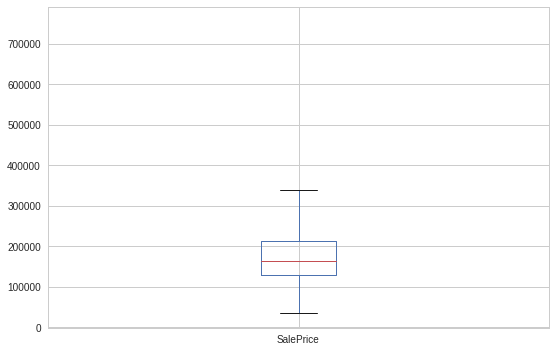

In [7]:
boxplot = df.boxplot(column=['SalePrice'])

(array([148., 723., 373., 135.,  51.,  19.,   4.,   3.,   2.,   2.]),
 array([ 34900., 106910., 178920., 250930., 322940., 394950., 466960.,
        538970., 610980., 682990., 755000.]),
 <a list of 10 Patch objects>)

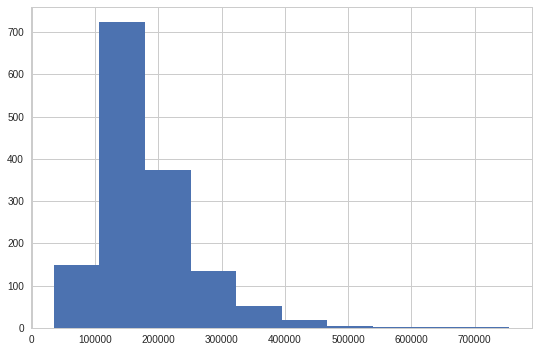

In [8]:
plt.hist(df.SalePrice)

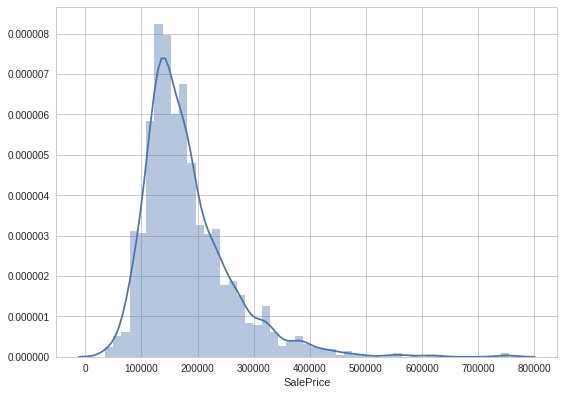

In [9]:
f, ax = plt.subplots(figsize=(8,6))
sns.distplot(df.SalePrice)

In [10]:
print(df.SalePrice.skew())
df.SalePrice.kurtosis()

1.8828757597682129


6.536281860064529

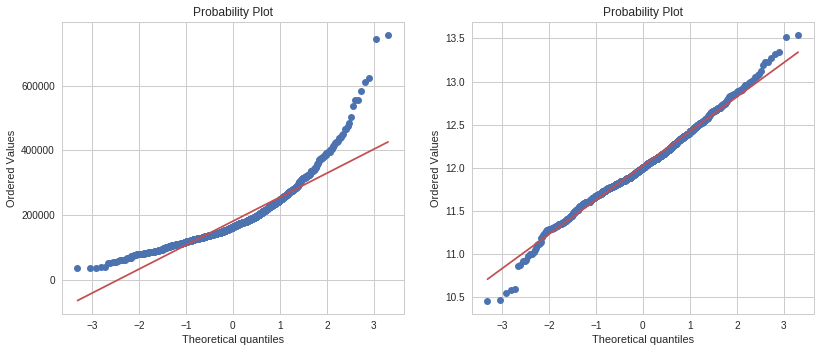

In [11]:
fig = plt.figure(figsize=(12,5))
fig.add_subplot(1,2,1)
res = stats.probplot(df.SalePrice, plot=plt)

fig.add_subplot(1,2,2)
res = stats.probplot(np.log1p(df.SalePrice), plot=plt)

In [12]:
# df.SalePrice = np.log1p(df.SalePrice) #uncomment to run once
df.SalePrice.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

TypeError: ignored

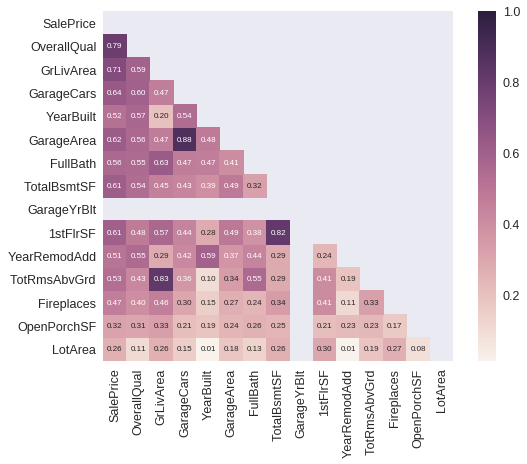

In [13]:
#saleprice correlation matrix
k = 15 #number of variables for heatmap
corrmat = abs(df.corr(method='spearman')) # correlation
cols = corrmat.nlargest(k, 'SalePrice').index # nlargest : Return this many descending sorted values
cm = np.corrcoef(df[cols].values.T) # correlation
sns.set(font_scale=1.25)
f, ax = plt.subplots(figsize=(8, 6))

#Sokratis Kouvaras help to hide upper symmetric metrics
mask = np.zeros_like(cm) 
mask[np.triu_indices_from(mask)] = True 
sns.set_style("white")
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f',annot_kws={'size': 8}, 
                 yticklabels=cols.values, xticklabels=cols.values, mask = mask)
plt.show()


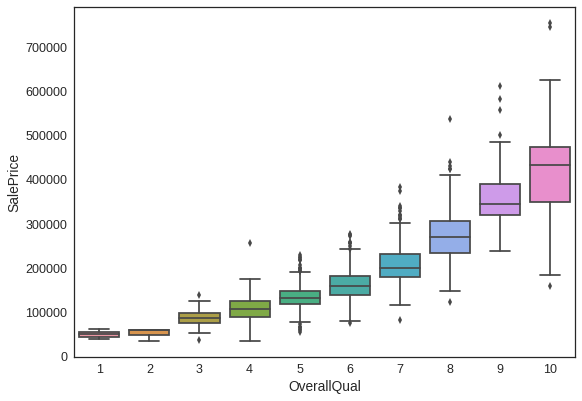

In [14]:
data = pd.concat([df["SalePrice"], df["OverallQual"]], axis=1)
f ,ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='OverallQual', y='SalePrice', data=data)


TypeError: ignored

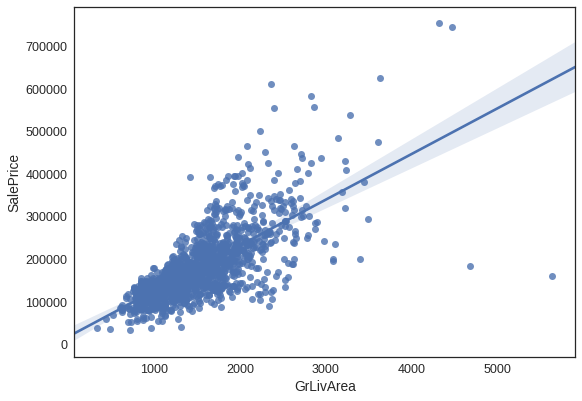

In [15]:
  data = pd.concat([df["SalePrice"], df["GrLivArea"]], axis=1)
f ,ax = plt.subplots(figsize=(8, 6))
fig = sns.regplot(x='GrLivArea', y='SalePrice', data=data)


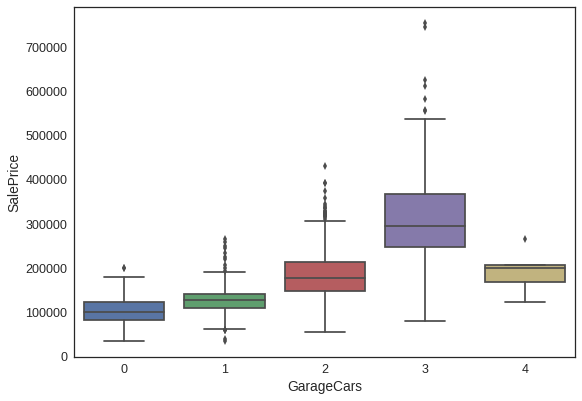

In [16]:
data = pd.concat([df["SalePrice"], df["GarageCars"]], axis=1)
f ,ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='GarageCars', y='SalePrice', data=data)


TypeError: ignored

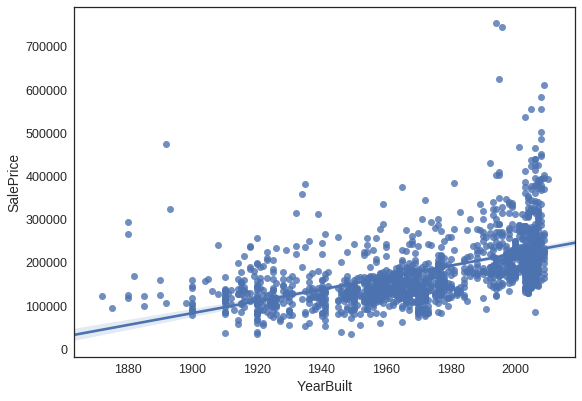

In [17]:
data = pd.concat([df["SalePrice"], df["YearBuilt"]], axis=1)
f ,ax = plt.subplots(figsize=(8, 6))
fig = sns.regplot(x='YearBuilt', y='SalePrice', data=data)


TypeError: ignored

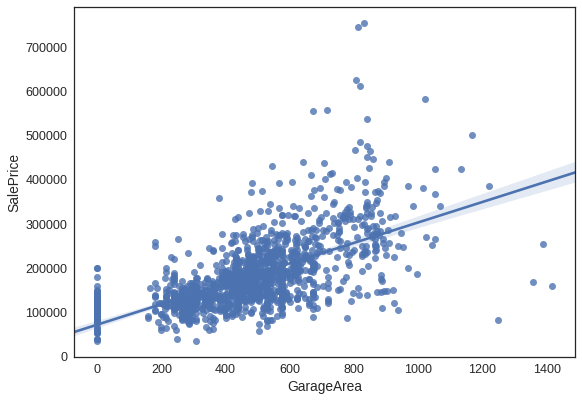

In [18]:
data = pd.concat([df["SalePrice"], df["GarageArea"]], axis=1)
f ,ax = plt.subplots(figsize=(8, 6))
fig = sns.regplot(x='GarageArea', y='SalePrice', data=data)

TypeError: ignored

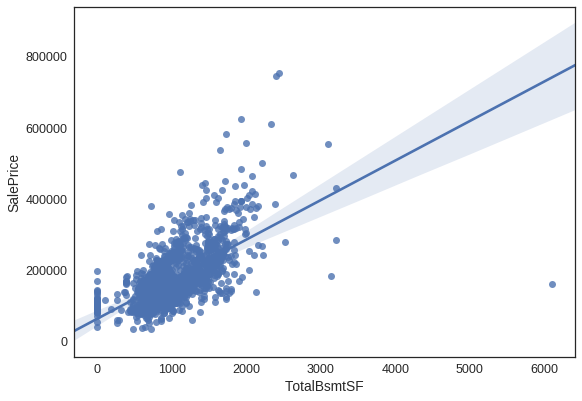

In [19]:
data = pd.concat([df['SalePrice'], df['TotalBsmtSF']], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.regplot(x='TotalBsmtSF', y="SalePrice", data=data)

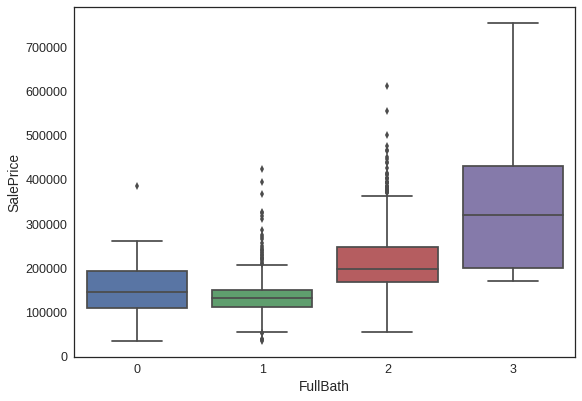

In [20]:
data = pd.concat([df['SalePrice'], df['FullBath']], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='FullBath', y="SalePrice", data=data)


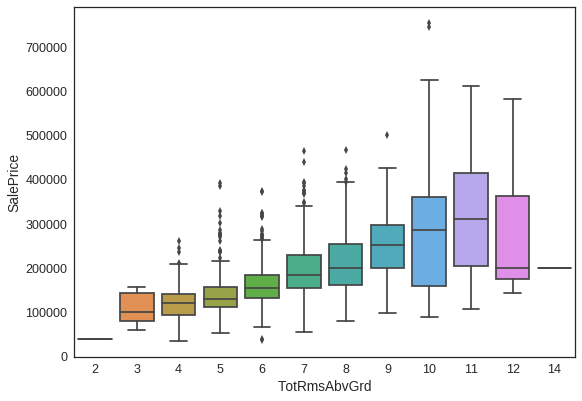

In [21]:
data = pd.concat([df['SalePrice'], df['TotRmsAbvGrd']], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x='TotRmsAbvGrd', y="SalePrice", data=data)

TypeError: ignored

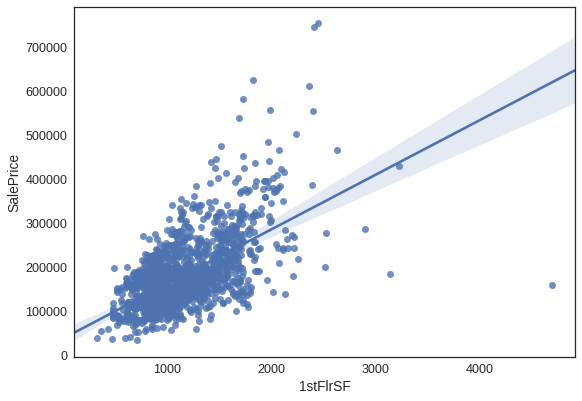

In [22]:
data = pd.concat([df['SalePrice'], df['1stFlrSF']], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.regplot(x='1stFlrSF', y="SalePrice", data=data)

TypeError: ignored

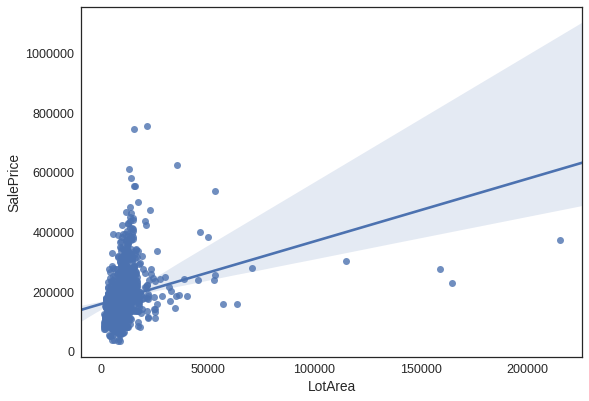

In [23]:
data = pd.concat([df['SalePrice'], df['LotArea']], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.regplot(x='LotArea', y="SalePrice", data=data)

### EDA for data analysis


In [0]:
nrow, ncol = df.shape

In [25]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

##### EDA for categorical values only

In [27]:
ds_cat = df.select_dtypes(include='object').copy()
ds_cat.head(2)

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [28]:
ds_cat['MSZoning'].unique()


array(['RL', 'RM', 'C (all)', 'FV', 'RH'], dtype=object)

In [29]:
len(ds_cat['MSZoning'].unique())


5

In [30]:
ds_cat['MSZoning'].nunique()


5

In [31]:
ds_cat['MSZoning'].isnull().sum()


0

In [32]:
#1.5 Percentage of Missing Values in that variable¶
ds_cat['MSZoning'].isnull().sum()/ nrow

(ds_cat['MSZoning'].isnull().sum()/ nrow).round(3)*100

0.0

### Do All in one fnc

In [33]:


ds_cat_stats = pd.DataFrame(columns = ['column', 'values', 'values_count_incna', 'values_count_nona', 
                                       'num_miss', 'pct_miss'])
tmp = pd.DataFrame()

for c in ds_cat.columns:
    tmp['column'] = [c]
    tmp['values'] = [ds_cat[c].unique()]
    tmp['values_count_incna'] = len(list(ds_cat[c].unique()))
    tmp['values_count_nona'] = int(ds_cat[c].nunique())
    tmp['num_miss'] = ds_cat[c].isnull().sum()
    tmp['pct_miss'] = (ds_cat[c].isnull().sum()/ len(ds_cat)).round(3)*100
    ds_cat_stats = ds_cat_stats.append(tmp)
    
ds_cat_stats

,column,values,values_count_incna,values_count_nona,num_miss,pct_miss
0,MSZoning,"[RL, RM, C (all), FV, RH]",5,5,0,0.0
0,Street,"[Pave, Grvl]",2,2,0,0.0
0,Alley,"[nan, Grvl, Pave]",3,2,1369,93.8
0,LotShape,"[Reg, IR1, IR2, IR3]",4,4,0,0.0
0,LandContour,"[Lvl, Bnk, Low, HLS]",4,4,0,0.0
0,Utilities,"[AllPub, NoSeWa]",2,2,0,0.0
0,LotConfig,"[Inside, FR2, Corner, CulDSac, FR3]",5,5,0,0.0
0,LandSlope,"[Gtl, Mod, Sev]",3,3,0,0.0
0,Neighborhood,"[CollgCr, Veenker, Crawfor, NoRidge, Mitchel, ...",25,25,0,0.0
0,Condition1,"[Norm, Feedr, PosN, Artery, RRAe, RRNn, RRAn, ...",9,9,0,0.0


In [34]:
# Let's do an Ascending sort on the Numboer of Distinct Categories for each categorical Variables
ds_cat_stats.sort_values(by = 'values_count_incna', inplace = True, ascending = True)

# And set the index to Column Names
ds_cat_stats.set_index('column', inplace = True)
ds_cat_stats

,values,values_count_incna,values_count_nona,num_miss,pct_miss
column,,,,,
Street,"[Pave, Grvl]",2,2,0,0.0
CentralAir,"[Y, N]",2,2,0,0.0
Utilities,"[AllPub, NoSeWa]",2,2,0,0.0
Alley,"[nan, Grvl, Pave]",3,2,1369,93.8
LandSlope,"[Gtl, Mod, Sev]",3,3,0,0.0
PavedDrive,"[Y, N, P]",3,3,0,0.0
PoolQC,"[nan, Ex, Fa, Gd]",4,3,1453,99.5
KitchenQual,"[Gd, TA, Ex, Fa]",4,4,0,0.0
GarageFinish,"[RFn, Unf, Fin, nan]",4,3,81,5.5


### 2. Frequency Distribution¶


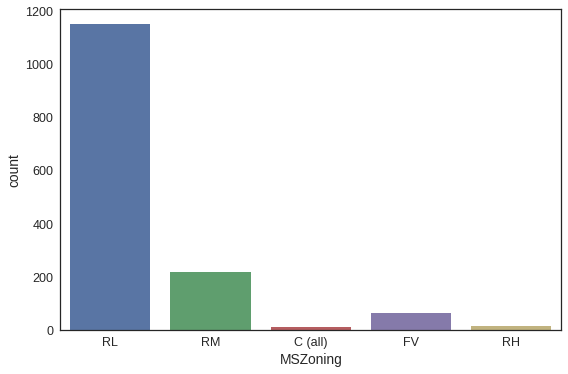

In [35]:
sns.countplot(data = ds_cat, x = 'MSZoning')


####Since we are working on a supervised ML problem we should also look at the relationshipt between the dependent variable and independent variable. In order to do that let's add our dependent variable to this dataset.¶


In [0]:
ds_cat['SalePrice'] = df.loc[ds_cat.index, 'SalePrice'].copy()


In [37]:
len(ds_cat.columns)

44

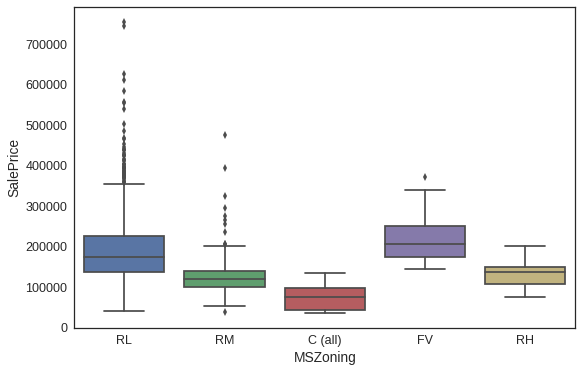

In [38]:
sns.boxplot(data = ds_cat, x='MSZoning', y='SalePrice')


TypeError: ignored

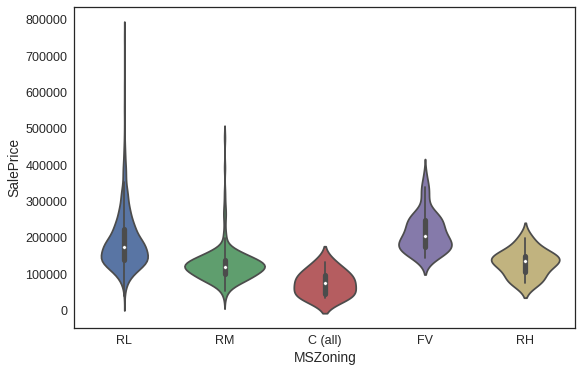

In [39]:
sns.violinplot(data = ds_cat, x='MSZoning', y='SalePrice')


TypeError: ignored

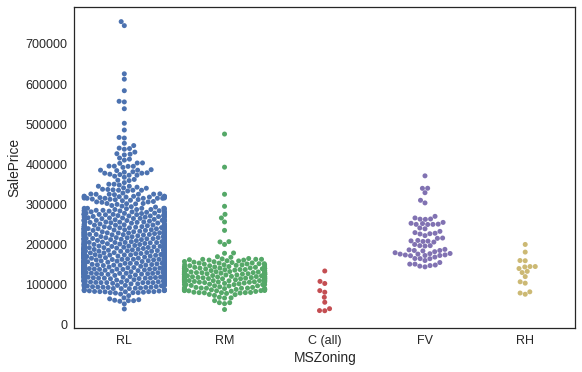

In [40]:
sns.swarmplot(data = ds_cat, x='MSZoning', y='SalePrice')


TypeError: ignored

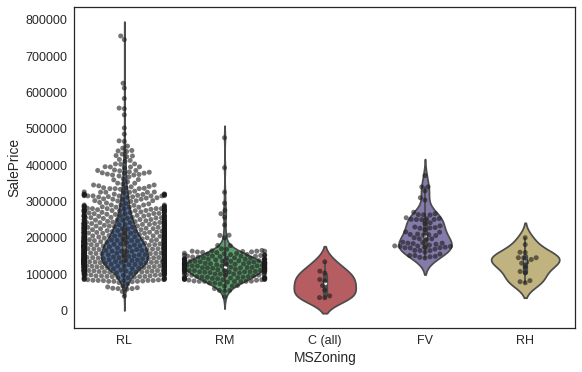

In [41]:
sns.violinplot(data = ds_cat, x='MSZoning', y='SalePrice')
sns.swarmplot(data = ds_cat, x='MSZoning', y='SalePrice', color = 'k', alpha = 0.6)

TypeError: ignored

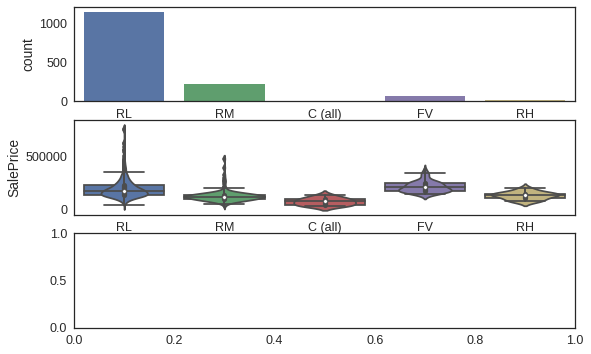

In [42]:
fig = plt.figure()

ax1 = fig.add_subplot(3,1,1) 
sns.countplot(data = ds_cat, x = 'MSZoning', ax = ax1)

ax2 = fig.add_subplot(3,1,2) 
sns.boxplot(data = ds_cat, x='MSZoning', y='SalePrice' , ax = ax2)

ax3 = fig.add_subplot(3,1,3)
sns.violinplot(data = ds_cat, x='MSZoning', y='SalePrice' , ax = ax2)


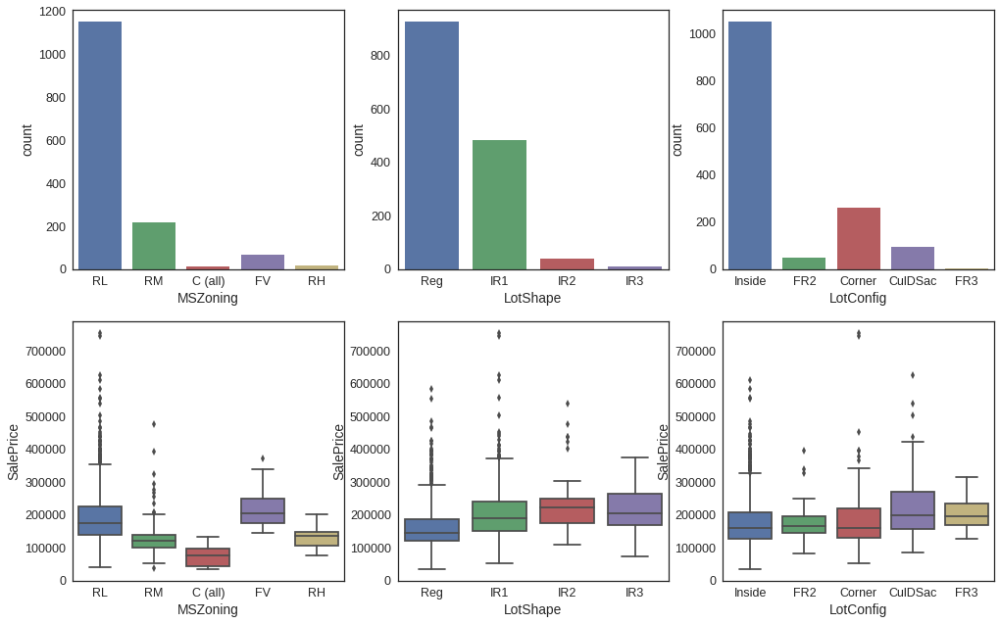

In [43]:
fig = plt.figure(figsize = (15,10))

ax1 = fig.add_subplot(2,3,1)
sns.countplot(data = ds_cat, x = 'MSZoning', ax=ax1)

ax2 = fig.add_subplot(2,3,2)
sns.countplot(data = ds_cat, x = 'LotShape', ax=ax2)

ax3 = fig.add_subplot(2,3,3)
sns.countplot(data = ds_cat, x = 'LotConfig', ax=ax3)

ax4 = fig.add_subplot(2,3,4)
sns.boxplot(data = ds_cat, x = 'MSZoning', y = 'SalePrice' , ax=ax4)
#sns.violinplot(data = ds_cat, x = 'MSZoning', y = 'SalePrice' , ax=ax4)
#sns.swarmplot(data = ds_cat, x = 'MSZoning', y='SalePrice', color = 'k', alpha = 0.4, ax=ax4  )

ax5 = fig.add_subplot(2,3,5)
sns.boxplot(data = ds_cat, x = 'LotShape', y = 'SalePrice', ax=ax5)
#sns.violinplot(data = ds_cat, x = 'LotShape', y = 'SalePrice', ax=ax5)
#sns.swarmplot(data = ds_cat, x = 'LotShape', y='SalePrice', color = 'k', alpha = 0.4, ax=ax5  )

ax6 = fig.add_subplot(2,3,6)
sns.boxplot(data = ds_cat, x = 'LotConfig', y = 'SalePrice', ax=ax6)
#sns.violinplot(data = ds_cat, x = 'LotConfig', y = 'SalePrice', ax=ax6)
#sns.swarmplot(data = ds_cat, x = 'LotConfig', y='SalePrice', color = 'k', alpha = 0.4, ax=ax6  )

### Putting it all together

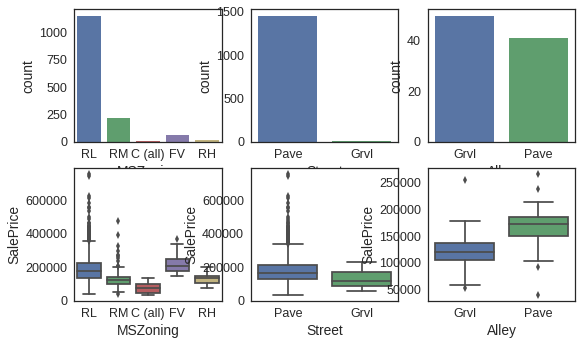

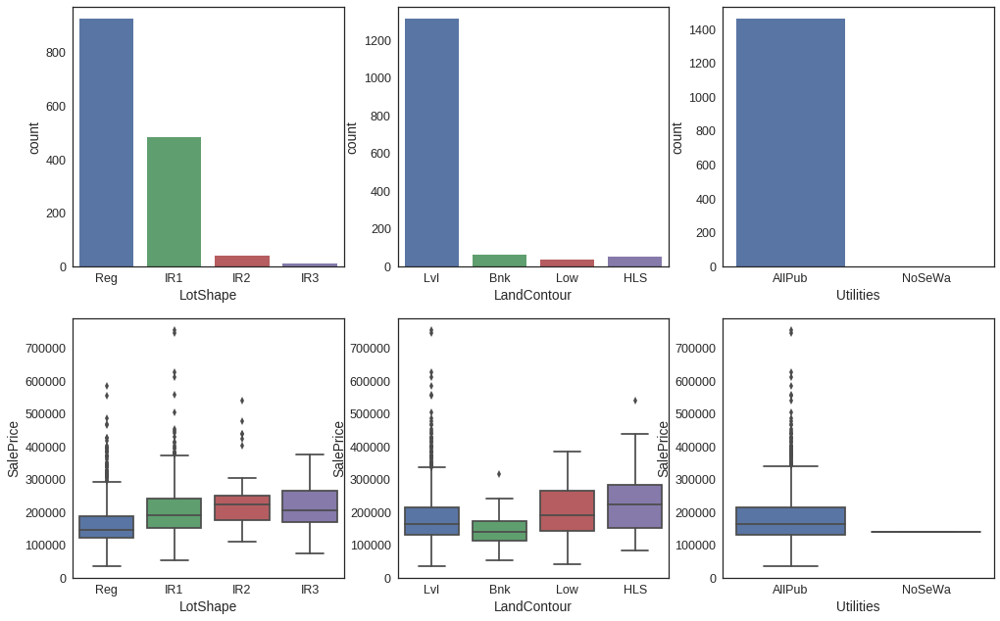

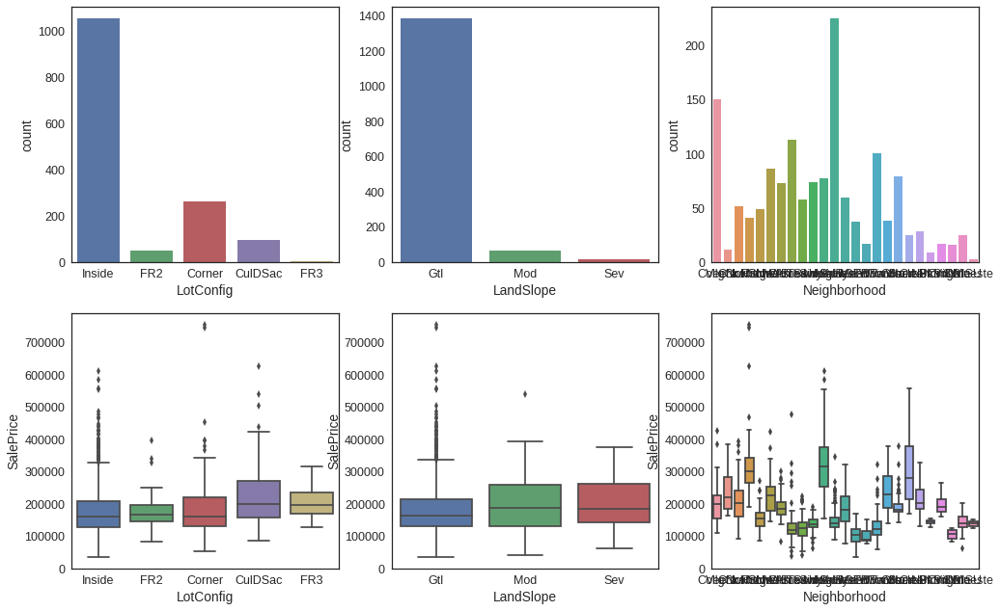

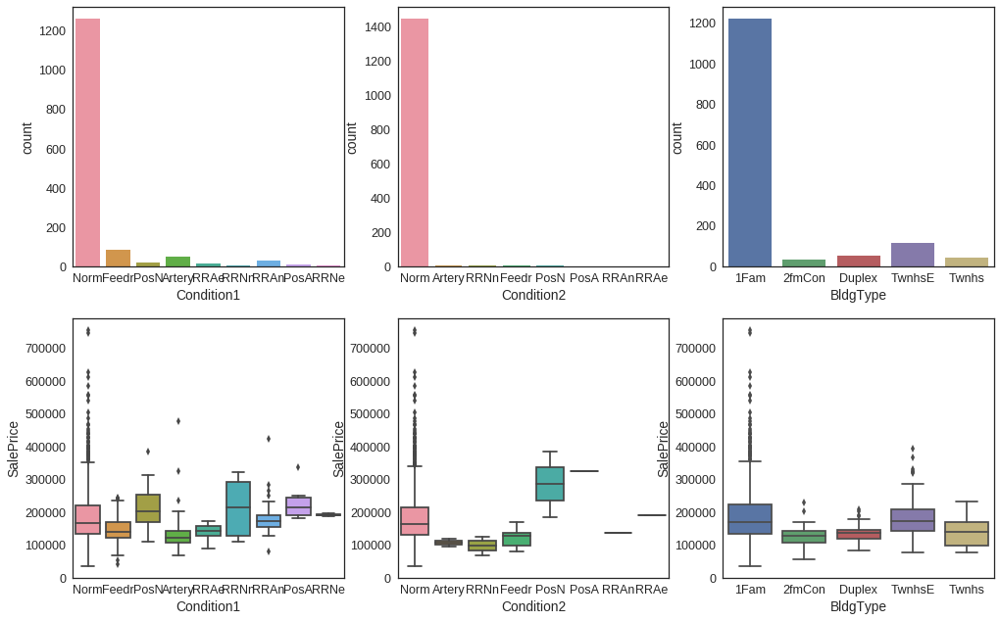

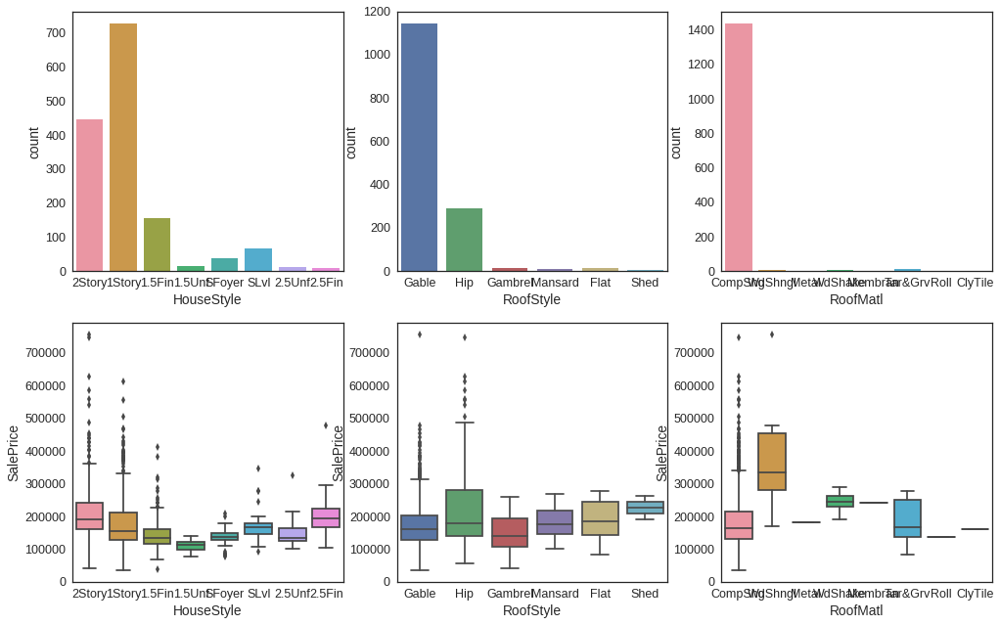

...

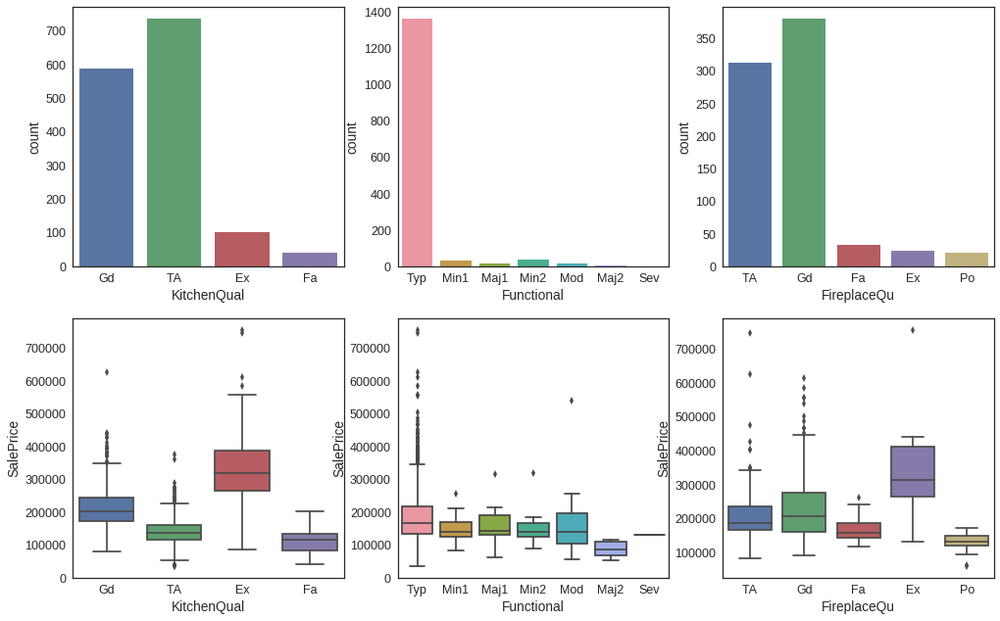

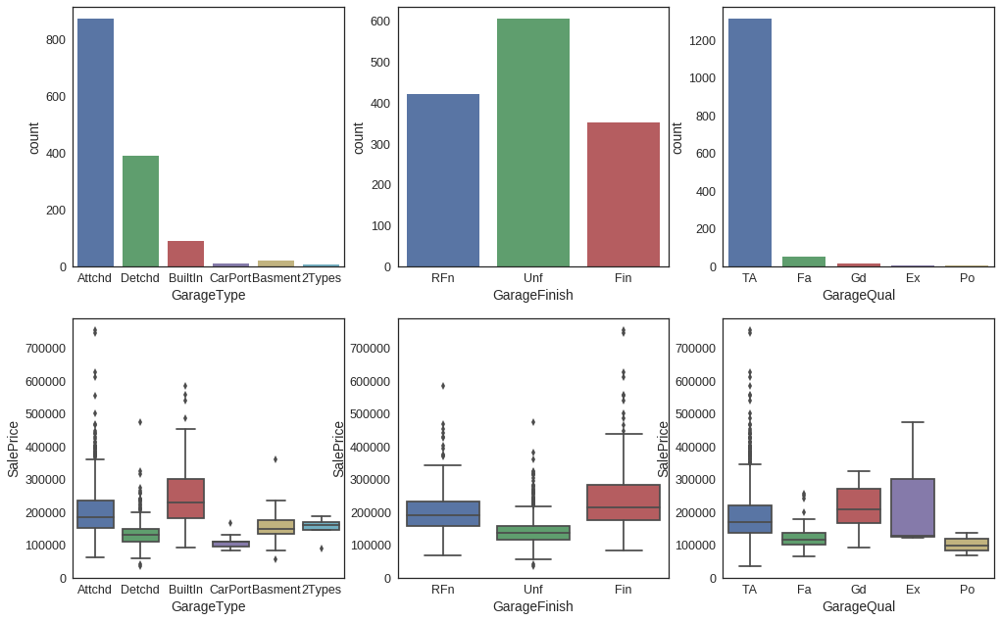

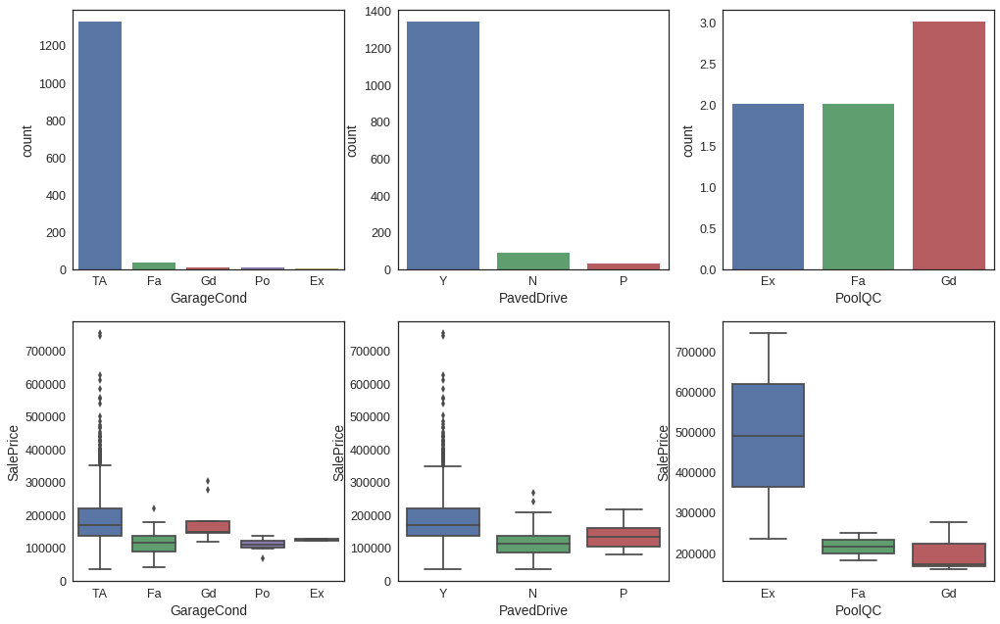

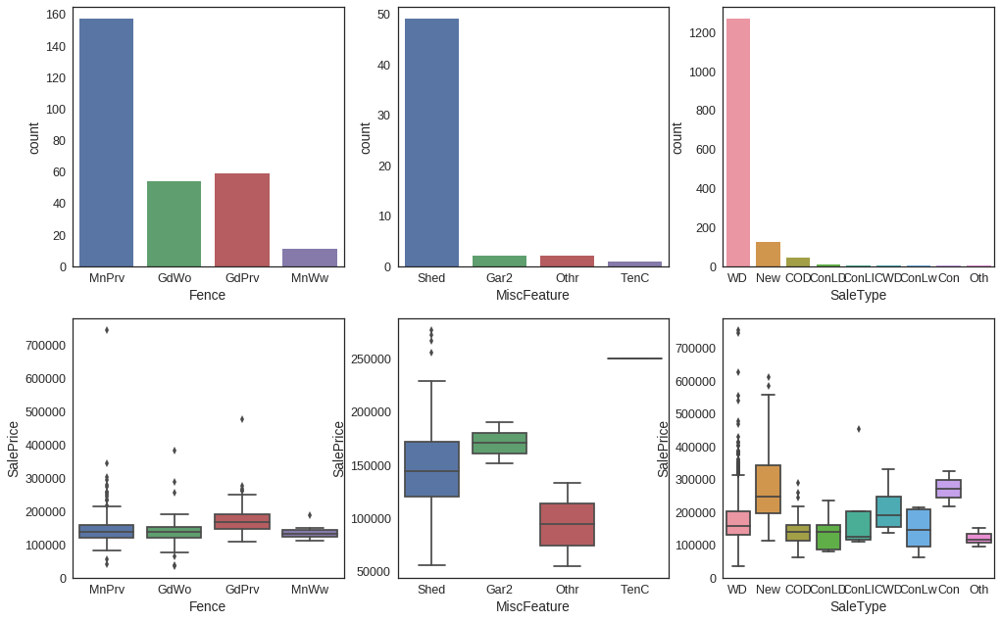

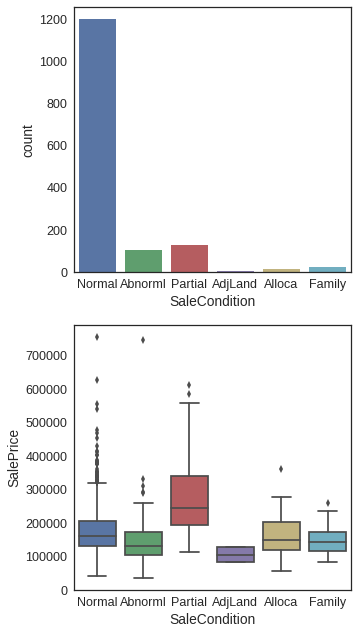

In [44]:
ix = 1
fig = plt.figure(figsize = (8,5))
for c in list(ds_cat.columns):
    if ix <= 3:
        if c != 'SalePrice':
            ax1 = fig.add_subplot(2,3,ix)
            sns.countplot(data = ds_cat, x=c, ax = ax1)
            ax2 = fig.add_subplot(2,3,ix+3)
            sns.boxplot(data=ds_cat, x=c, y='SalePrice', ax=ax2)
            #sns.violinplot(data=ds_cat, x=c, y='SalePrice', ax=ax2)
            #sns.swarmplot(data = ds_cat, x=c, y ='SalePrice', color = 'k', alpha = 0.4, ax=ax2)
            
    ix = ix +1
    if ix == 4: 
        fig = plt.figure(figsize = (15,10))
        ix =1

#### We can see which variables have a large effect on SalePrice like PoolQC, KitchenQual, Condition1 and 2, Neighborhood, Alley, MSZoning



Text(0.5,1,'Total Missing Value (%)')

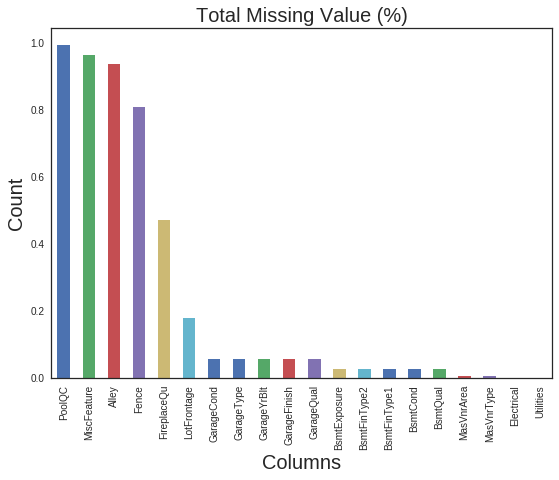

In [45]:
#missing data
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

#histogram
#missing_data = missing_data.head(20)
percent_data = percent.head(20)
percent_data.plot(kind="bar", figsize = (8,6), fontsize = 10)
plt.xlabel("Columns", fontsize = 20)
plt.ylabel("Count", fontsize = 20)
# pq = pd.DataFrame(percent_data.index)
# plt.xticks(percent_data, pq[0], rotation='vertical')
plt.title("Total Missing Value (%)", fontsize = 20)

In [0]:
df_test = pd.read_csv('/test.csv')

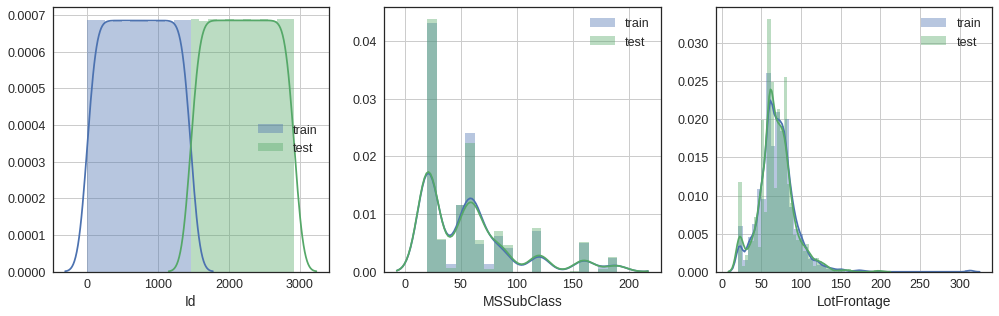

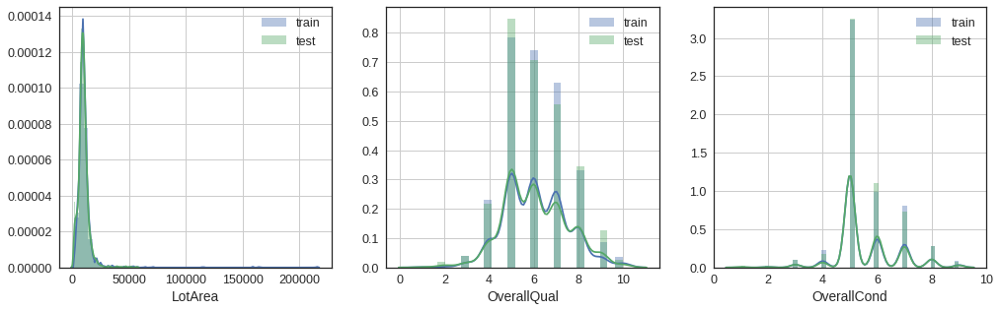

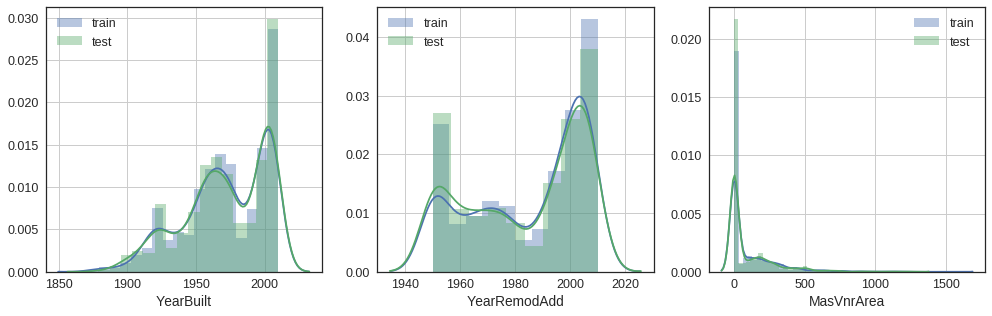

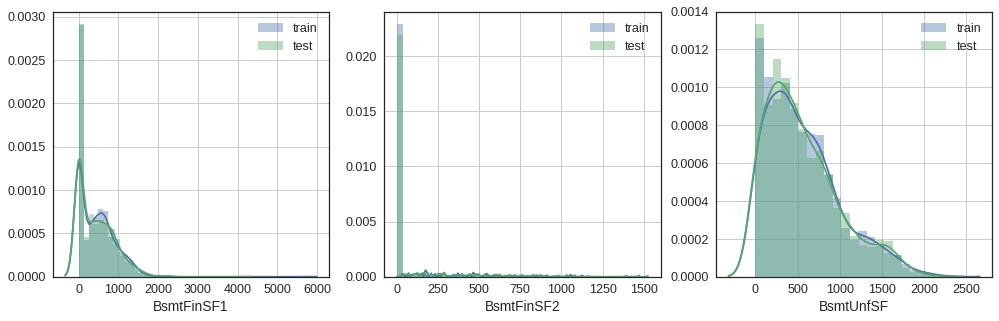

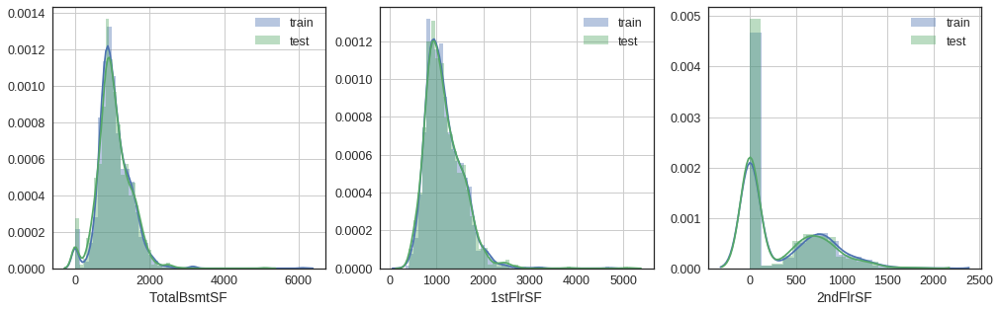

...

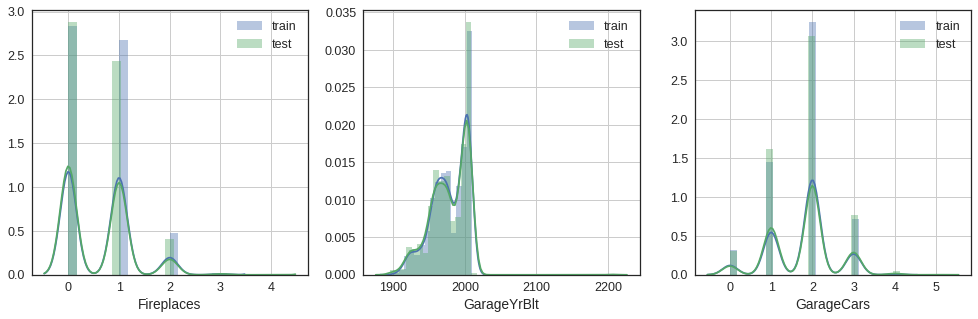

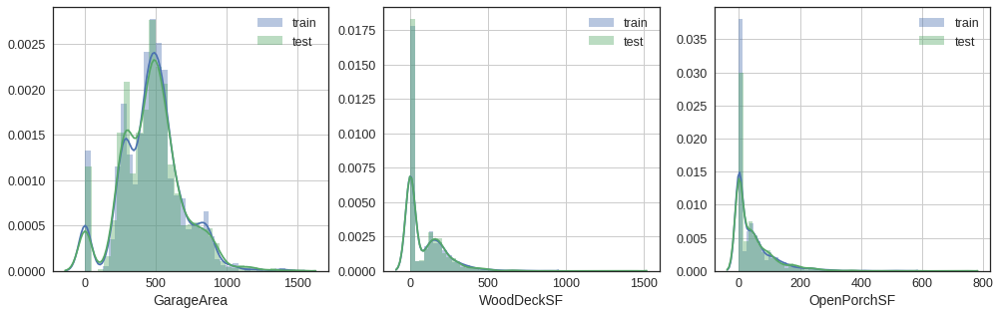

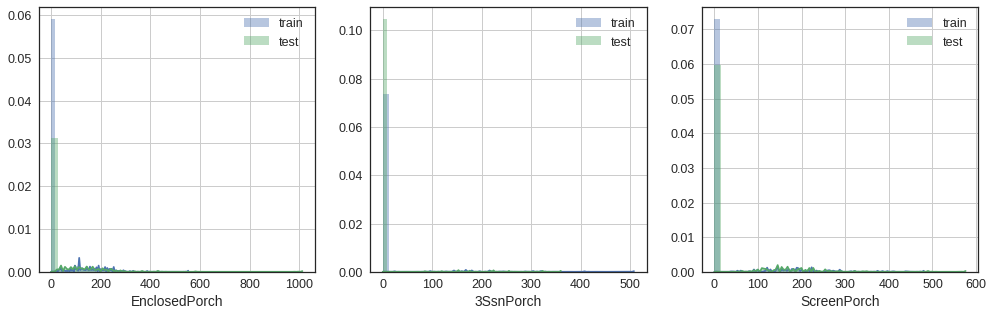

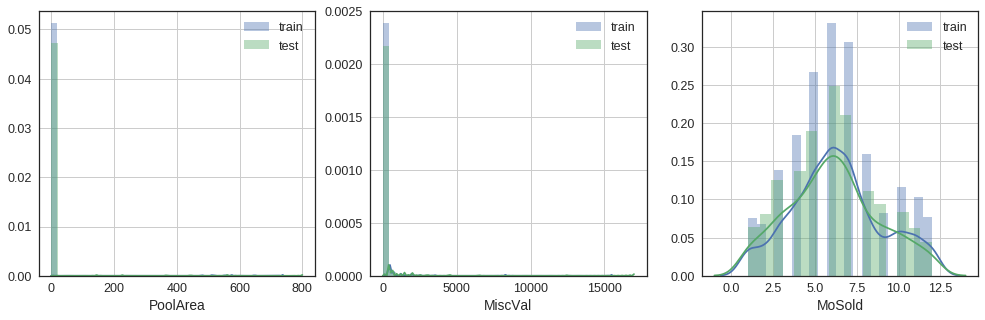

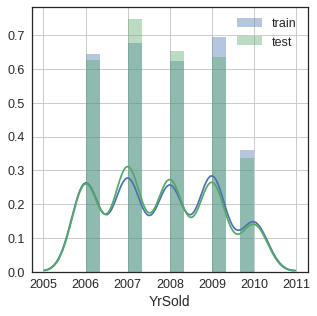

In [47]:
Numeric = df.copy()
del Numeric['SalePrice']
Numeric_columns = Numeric.select_dtypes(include = ["int64","float64"]).columns

ix = 1
fig = plt.figure(figsize = (15,10))
for c in list(Numeric_columns):
    if ix <= 3:
            ax2 = fig.add_subplot(2,3,ix+3)
            sns.distplot(df[c].dropna())
            sns.distplot(df_test[c].dropna())
            plt.legend(['train', 'test'])
            plt.grid()            
    ix = ix +1
    if ix == 4: 
        fig = plt.figure(figsize = (15,10))
        ix =1
del Numeric

## 2. Preprocessing¶


### 2.1 Data Cleaning : Outliers¶
In fact, it is difficult to judge whether it is an outlier or not by only the above information. And since the number of data is as small as 1400, the removal of outlier affects the model greatly. The easiest way to do this is to remove the values we thought were outliers and to see if the leader board score (LB) and cross validation score (CV) were going up.

In [0]:
# Deleting outliers
df = df[df['Id'] != 692][df['Id'] != 1183]

# drop outliers
df = df.drop(df[(df['GrLivArea']>4000) & (df['SalePrice']<12.5)].index)
df = df.drop(df[(df['LotArea']>150000)].index)
df = df.drop(df[(df['GarageArea']>1200) & (df['SalePrice']<12.5)].index)

###2.1 Data Cleaning : Missing values¶


TypeError: ignored

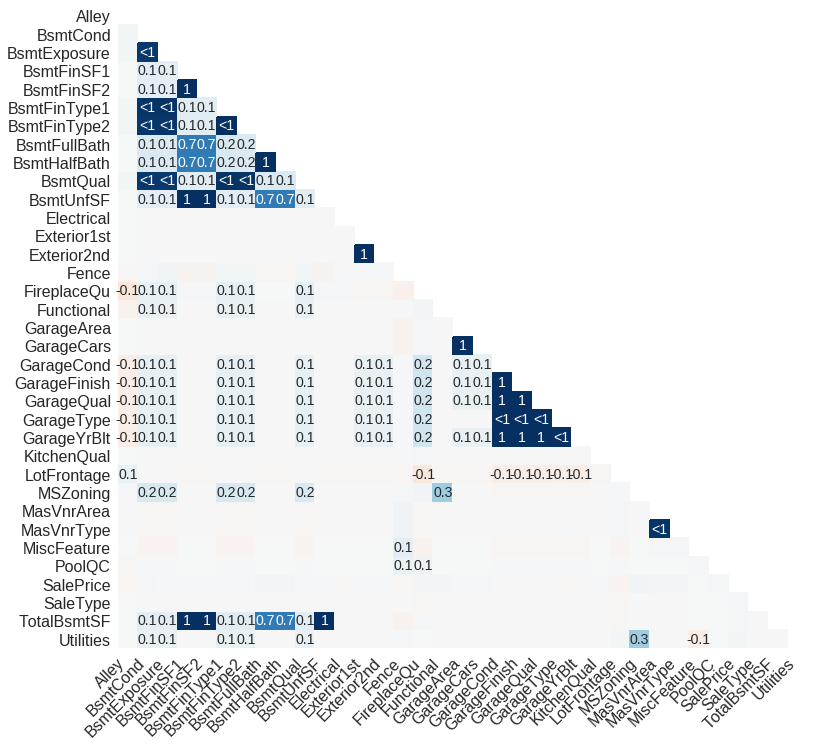

In [49]:
import missingno as msno
len_train = df.shape[0]
y_reg = df['SalePrice']
Id = df_test['Id']
df_all = pd.concat([df,df_test])
del df_all['Id']
missingdata_df = df_all.columns[df_all.isnull().any()].tolist()
msno.heatmap(df_all[missingdata_df], figsize=(11,11))

In [50]:
df_all['Utilities'].unique()


array(['AllPub', 'NoSeWa', nan], dtype=object)

In [51]:
df_all['Utilities'].describe()



count       2912
unique         2
top       AllPub
freq        2911
Name: Utilities, dtype: object

In [52]:
df_all.Utilities.value_counts()

AllPub    2911
NoSeWa       1
Name: Utilities, dtype: int64

In [0]:
# as NoSeWa is for only 1 and else are AllPub
del df_all['Utilities']


In [0]:
#in these features, NAN means none

df_all["PoolQC"] = df_all["PoolQC"].fillna("None")
df_all["MiscFeature"] = df_all["MiscFeature"].fillna("None")
df_all["Alley"] = df_all["Alley"].fillna("None")
df_all["Fence"] = df_all["Fence"].fillna("None")
df_all["FireplaceQu"] = df_all["FireplaceQu"].fillna("None")
df_all['BsmtQual'] = df_all['BsmtQual'].fillna('None')
df_all['BsmtCond'] = df_all['BsmtCond'].fillna('None')
df_all['BsmtExposure'] = df_all['BsmtExposure'].fillna('None')
df_all['BsmtFinType1'] = df_all['BsmtFinType1'].fillna('None')
df_all['BsmtFinType2'] = df_all['BsmtFinType2'].fillna('None')
df_all['GarageType'] = df_all['GarageType'].fillna('None')
df_all['GarageFinish'] = df_all['GarageFinish'].fillna('None')
df_all['GarageQual'] = df_all['GarageQual'].fillna('None')
df_all['GarageCond'] = df_all['GarageCond'].fillna('None')

In [0]:
#in these features, NAN means 0

df_all['BsmtFinSF1'] = df_all['BsmtFinSF1'].fillna(0)
df_all['BsmtFinSF2'] = df_all['BsmtFinSF2'].fillna(0)
df_all['BsmtUnfSF'] = df_all['BsmtUnfSF'].fillna(0)
df_all['TotalBsmtSF'] = df_all['TotalBsmtSF'].fillna(0)
df_all['BsmtFullBath'] = df_all['BsmtFullBath'].fillna(0)
df_all['BsmtHalfBath'] = df_all['BsmtHalfBath'].fillna(0)
df_all['MasVnrArea'] = df_all['MasVnrArea'].fillna(0)
df_all['GarageYrBlt'] = df_all['GarageYrBlt'].fillna(0)
df_all['GarageCars'] = df_all['GarageCars'].fillna(0)
df_all['GarageArea'] = df_all['GarageArea'].fillna(0)

In [0]:
# These features, we just fill them with common case i . e mode

df_all['MSZoning'] = df_all['MSZoning'].fillna(df_all['MSZoning'].mode()[0])
df_all['Exterior1st'] = df_all['Exterior1st'].fillna(df_all['Exterior1st'].mode()[0])
df_all['Exterior2nd'] = df_all['Exterior2nd'].fillna(df_all['Exterior2nd'].mode()[0])
df_all['MasVnrType'] = df_all['MasVnrType'].fillna(df_all['MasVnrType'].mode()[0])
df_all['Electrical'] = df_all['Electrical'].fillna(df_all['Electrical'].mode()[0])
df_all['KitchenQual'] = df_all['KitchenQual'].fillna(df_all['KitchenQual'].mode()[0])
df_all['Functional'] = df_all['Functional'].fillna(df_all['Functional'].mode()[0])
df_all['SaleType'] = df_all['SaleType'].fillna(df_all['SaleType'].mode()[0])

In [57]:
#We will fill LotFrontage in assuming that LotFrontage is similar between neighbors. So we have to 
#make sure that the assumption is correct.

df_all[df_all['Neighborhood']=='BrkSide']['LotFrontage'].describe()



count     95.000000
mean      55.789474
std       12.722818
min       50.000000
25%       50.000000
50%       51.000000
75%       58.500000
max      144.000000
Name: LotFrontage, dtype: float64

In [58]:
df_all[df_all['Neighborhood']=='CollgCr']['LotFrontage'].describe()


count    220.000000
mean      71.336364
std       15.940401
min       36.000000
25%       64.000000
50%       70.000000
75%       78.000000
max      133.000000
Name: LotFrontage, dtype: float64

In [0]:
#When I look at two situations, it is similar from 25quantile to 75quantile, 
#so it may be ok to fill with median

# LotFrontage has more missing value, thus we consider it more delicately
df_all["LotFrontage"] = df_all.groupby("Neighborhood")["LotFrontage"].transform(lambda x: 
                                                                                x.fillna(x.median()))


Text(0.5,1,'Total Missing Value (%)')

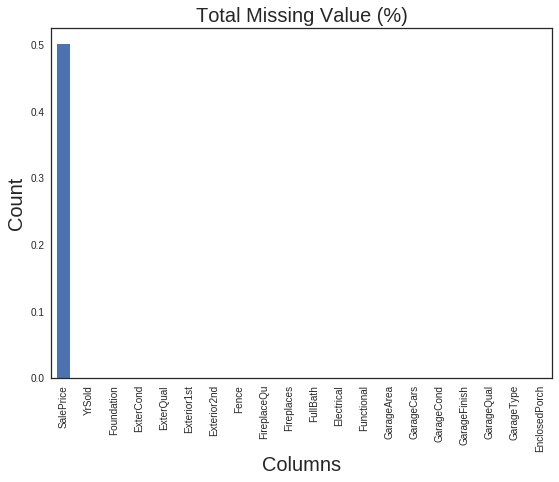

In [60]:
#missing data
total = df_all.isnull().sum().sort_values(ascending=False)
percent = (df_all.isnull().sum()/df_all.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

#histogram
#missing_data = missing_data.head(20)
percent_data = percent.head(20)
percent_data.plot(kind="bar", figsize = (8,6), fontsize = 10)
plt.xlabel("Columns", fontsize = 20)
plt.ylabel("Count", fontsize = 20)
plt.title("Total Missing Value (%)", fontsize = 20)


Now, all variables has no NA


###2.3.3. Frequency Encoding¶


In [0]:
# Changing OverallCond,MSSubClass into a categorical variable

df_all.MSSubClass  = df_all.MSSubClass.apply(str)
# Changing OverallCond into a categorical variable
df_all.OverallCond = df_all.OverallCond.astype(str)


In [68]:
categorical_features = df_all.select_dtypes(include=["object"]).columns
numerical_features = df_all.select_dtypes(exclude=["object"]).columns
numerical_features = numerical_features.drop(["SalePrice"])

print("Numerical features : " + str(len(numerical_features)))
print("Categorical features : " + str(len(categorical_features)))

Numerical features : 35
Categorical features : 44


#### one hot encoding

In [70]:
#break each unique value of any column into category
from sklearn.preprocessing import OneHotEncoder

one_hot_encoding = df_all.copy()
one_hot_encoding = pd.get_dummies(one_hot_encoding)
one_hot_encoding.head()

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BsmtFinSF1,BsmtFinSF2,BsmtFullBath,BsmtHalfBath,BsmtUnfSF,EnclosedPorch,Fireplaces,FullBath,GarageArea,GarageCars,GarageYrBlt,GrLivArea,HalfBath,KitchenAbvGr,LotArea,LotFrontage,LowQualFinSF,MasVnrArea,MiscVal,MoSold,OpenPorchSF,OverallQual,PoolArea,SalePrice,ScreenPorch,TotRmsAbvGrd,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold,Alley_Grvl,Alley_None,Alley_Pave,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_None,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_None,BsmtQual_TA,CentralAir_N,CentralAir_Y,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_None,FireplaceQu_Po,FireplaceQu_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_None,GarageCond_Po,GarageCond_TA,GarageFinish_Fin,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,MSSubClass_120,MSSubClass_150,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MiscFeature_Gar2,MiscFeature_None,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,N

#### label encoding 

In [73]:
#give categorical unique values into numeric 0,1,2,3 category
label_encoding = df_all.copy()
for i in categorical_features:
  label_encoding[i] , indexer = pd.factorize(label_encoding[i])  # convert to 0 , 1,2 coding
label_encoding.head()

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtFinType1,BsmtFinType2,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtUnfSF,CentralAir,Condition1,Condition2,Electrical,EnclosedPorch,ExterCond,ExterQual,Exterior1st,Exterior2nd,Fence,FireplaceQu,Fireplaces,Foundation,FullBath,Functional,GarageArea,GarageCars,GarageCond,GarageFinish,GarageQual,GarageType,GarageYrBlt,GrLivArea,HalfBath,Heating,HeatingQC,HouseStyle,KitchenAbvGr,KitchenQual,LandContour,LandSlope,LotArea,LotConfig,LotFrontage,LotShape,LowQualFinSF,MSSubClass,MSZoning,MasVnrArea,MasVnrType,MiscFeature,MiscVal,MoSold,Neighborhood,OpenPorchSF,OverallCond,OverallQual,PavedDrive,PoolArea,PoolQC,RoofMatl,RoofStyle,SaleCondition,SalePrice,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
0,856,854,0,0,3,0,0,0,706.0,0.0,0,0,1.0,0.0,0,150.0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,548.0,2.0,0,0,0,0,2003.0,1710,1,0,0,0,1,0,0,0,8450,0,65.0,0,0,0,0,196.0,0,0,0,2,0,61,0,7,0,0,0,0,0,0,208500.0,0,0,0,8,856.0,0,2003,2003,2008
1,1262,0,0,0,3,0,0,1,978.0,0.0,1,0,0.0,1.0,0,284.0,0,1,0,0,0,0,1,1,1,0,1,1,1,2,0,460.0,2.0,0,0,0,0,1976.0,1262,0,0,0,1,1,1,0,0,9600,1,80.0,0,0,1,0,0.0,1,0,0,5,1,0,1,6,0,0,0,0,0,0,181500.0,0,0,0,6,1262.0,298,1976,1976,2007
2,920,866,0,0,3,0,0,2,486.0,0.0,0,0,1.0,0.0,0,434.0,0,0,0,0,0,0,0,0,0,0,1,1,0,2,0,608.0,2.0,0,0,0,0,2001.0,1786,1,0,0,0,1,0,0,0,11250,0,68.0,1,0,0,0,162.0,0,0,0,9,0,42,0,7,0,0,0,0,0,0,223500.0,0,0,0,6,920.0,0,2001,2002,2008
3,961,756,0,0,3,0,1,0,216.0,0.0,1,0,1.0,0.0,1,540.0,0,0,0,0,272,0,1,2,2,0,2,1,2,1,0,642.0,3.0,0,1,0,1,1998.0,1717,0,0,1,0,1,0,0,0,9550,2,60.0,1,0,2,0,0.0,1,0,0,2,2,35,0,7,0,0,0,0,0,1,140000.0,0,0,0,7,756.0,0,1915,1970,2006
4,1145,1053,0,0,4,0,0,3,655.0,0.0,0,0,1.0,0.0,0,490.0,0,0,0,0,0,0,0,0,0,0,1,1,0,2,0,836.0,3.0,0,0,0,0,2000.0,2198,1,0,0,0,1,0,0,0,14260,1,84.0,1,0,0,0,350.0,0,0,0,12,3,84,0,8,0,0,0,0,0,0,250000.0,0,0,0,9,1145.0,192,2000,2000,2008


#### frequency encoding

In [74]:
frequency_encoding_all = df_all.copy()
    
def frequency_encoding(frame, col):
    freq_encoding = frame.groupby([col]).size()/frame.shape[0] 
    freq_encoding = freq_encoding.reset_index().rename(columns={0:'{}_Frequency'.format(col)})
    return frame.merge(freq_encoding, on=col, how='left')

for col in categorical_features:
    frequency_encoding_all = frequency_encoding(frequency_encoding_all, col)
frequency_encoding_all = frequency_encoding_all.drop(categorical_features,axis=1, inplace=False)
frequency_encoding_all.head()

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BsmtFinSF1,BsmtFinSF2,BsmtFullBath,BsmtHalfBath,BsmtUnfSF,EnclosedPorch,Fireplaces,FullBath,GarageArea,GarageCars,GarageYrBlt,GrLivArea,HalfBath,KitchenAbvGr,LotArea,LotFrontage,LowQualFinSF,MasVnrArea,MiscVal,MoSold,OpenPorchSF,OverallQual,PoolArea,SalePrice,ScreenPorch,TotRmsAbvGrd,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold,Alley_Frequency,BldgType_Frequency,BsmtCond_Frequency,BsmtExposure_Frequency,BsmtFinType1_Frequency,BsmtFinType2_Frequency,BsmtQual_Frequency,CentralAir_Frequency,Condition1_Frequency,Condition2_Frequency,Electrical_Frequency,ExterCond_Frequency,ExterQual_Frequency,Exterior1st_Frequency,Exterior2nd_Frequency,Fence_Frequency,FireplaceQu_Frequency,Foundation_Frequency,Functional_Frequency,GarageCond_Frequency,GarageFinish_Frequency,GarageQual_Frequency,GarageType_Frequency,Heating_Frequency,HeatingQC_Frequency,HouseStyle_Frequency,KitchenQual_Frequency,LandContour_Frequency,LandSlope_Frequency,LotConfig_Frequency,LotShape_Frequency,MSSubClass_Frequency,MSZoning_Frequency,MasVnrType_Frequency,MiscFeature_Frequency,Neighborhood_Frequency,OverallCond_Frequency,PavedDrive_Frequency,PoolQC_Frequency,RoofMatl_Frequency,RoofStyle_Frequency,SaleCondition_Frequency,SaleType_Frequency,Street_Frequency
0,856,854,0,3,706.0,0.0,1.0,0.0,150.0,0,0,2,548.0,2.0,2003.0,1710,1,1,8450,65.0,0,196.0,0,2,61,7,0,208500.0,0,8,856.0,0,2003,2003,2008,0.932052,0.830817,0.892588,0.653397,0.290666,0.854496,0.414207,0.932739,0.859986,0.989705,0.915237,0.869252,0.335278,0.352093,0.348318,0.804393,0.487303,0.448181,0.931366,0.90906,0.277968,0.891901,0.589568,0.9849,0.511325,0.298559,0.394647,0.899108,0.952642,0.731640,0.637955,0.196637,0.776939,0.301304,0.964653,0.091627,0.563830,0.904598,0.996911,0.985587,0.791695,0.822924,0.865134,0.996225
1,1262,0,0,3,978.0,0.0,0.0,1.0,284.0,0,1,2,460.0,2.0,1976.0,1262,0,1,9600,80.0,0,0.0,0,5,0,6,0,181500.0,0,6,1262.0,298,1976,1976,2007,0.932052,0.830817,0.892588,0.093342,0.146534,0.854496,0.414207,0.932739,0.056280,0.989705,0.915237,0.869252,0.616335,0.154427,0.153397,0.804393,0.202471,0.422787,0.931366,0.90906,0.277968,0.891901,0.589568,0.9849,0.511325,0.504461,0.511668,0.899108,0.952642,0.029170,0.637955,0.369938,0.776939,0.605010,0.964653,0.008236,0.049417,0.904598,0.996911,0.985587,0.791695,0.822924,0.865134,0.996225
2,920,866,0,3,486.0,0.0,1.0,0.0,434.0,0,1,2,608.0,2.0,2001.0,1786,1,1,11250,68.0,0,162.0,0,9,42,7,0,223500.0,0,6,920.0,0,2001,2002,2008,0.932052,0.830817,0.892588,0.082018,0.290666,0.854496,0.414207,0.932739,0.859986,0.989705,0.915237,0.869252,0.335278,0.352093,0.348318,0.804393,0.202471,0.448181,0.931366,0.90906,0.277968,0.891901,0.589568,0.9849,0.511325,0.298559,0.394647,0.899108,0.952642,0.731640,0.331160,0.196637,0.776939,0.301304,0.964653,0.091627,0.563830,0.904598,0.996911,0.985587,0.791695,0.822924,0.865134,0.996225
3,961,756,0,3,216.0,0.0,1.0,0.0,540.0,272,1,1,642.0,3.0,1998.0,1717,0,1,9550,60.0,0,0.0,0,2,35,7,0,140000.0,0,7,756.0,0,1915,1970,2006,0.932052,0.830817,0.041867,0.653397,0.146534,0.854496,0.439945,0.932739,0.859986,0.989705,0.915237,0.869252,0.616335,0.140357,0.027797,0.804393,0.254633,0.106726,0.931366,0.90906,0.422100,0.891901,0.267330,0.9849,0.162320,0.298559,0.394647,0.899108,0.952642,0.174331,0.331160,0.043926,0.776939,0.605010,0.964653,0.035347,0.563830,0.904598,0.996911,0.985587,0.791695,0.064859,0.865134,0.996225
4,1145,1053,0,4,655.0,0.0,1.0,0.0,490.0,0,1,2,836.0,3.0,2000.0,2198,1,1,14260,84.0,0,350.0,0,12,84,8,0,250000.0,0,9,1145.0,192,2000,2000,2008,0.932052,0.830817,0.892588,0.143102,0.290666,0.854496,0.414207,0.932739,0.859986,0.989705,0.915237,0.869252,0.335278,0.352093,0.348318,0.804393,0.202471,0.448181,0.931366,0.90906,0.277968,0.891901,0.589568,0.9849,0.511325,0.298559,0.394647,0.899108,0.952642,0.029170,0.331160,0.196637,0.776939,0.301304,0.964653,0.023679,0.563830,0.904598,0.996911,0.985587,0.791695,0.822924,0.865134,0.996225


### Cross validation

Cross validation is very important. It is a criterion to judge the performance of the model in the competition. Because LB uses only 50% of the total data (usually 20%), it can secure the reliability of the model.

The hold out method is used when there is no difference between the CVs of folds or data related time. So i use the k-fold or LOOCV by testing encoding method

In [0]:
from sklearn.model_selection import KFold, cross_val_score, train_test_split


In [0]:
#K-folds Validation function
n_folds = 5 # if LOOCV k = df_train.shape[0]

def rmsle_cv(model,df):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(df.values)
    rmse= np.sqrt(-cross_val_score(model, df.values, y_reg, scoring="neg_mean_squared_error", cv = kf))
    return(rmse)


In [0]:
import lightgbm as lgb



In [82]:
one_hot_encoding_train = one_hot_encoding[:len_train]
one_hot_encoding_test = one_hot_encoding[len_train:]

model = lgb.LGBMRegressor(objective='regression',num_leaves=5,  
                              learning_rate=0.05, n_estimators=720,  
                              max_bin = 55, bagging_fraction = 0.8,  
                              bagging_freq = 5, feature_fraction = 0.2319,  
                              feature_fraction_seed=9, bagging_seed=9,  
                              min_data_in_leaf =6, min_sum_hessian_in_leaf = 11)  
score = rmsle_cv(model,one_hot_encoding_train)  
print("One-hot encoding(5-folds) LGBM score: {:.4f} ({:.4f})\n" .format(score.mean(), score.std()))

def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

One-hot encoding(5-folds) LGBM score: 13600.0639 (1667.5618)



In [0]:
# n_folds = one_hot_encoding_train.shape[0] # if LOOCV k = df_train.shape[0]

# model = lgb.LGBMRegressor(objective='regression',num_leaves=5,  
#                               learning_rate=0.05, n_estimators=720,  
#                               max_bin = 55, bagging_fraction = 0.8,  
#                               bagging_freq = 5, feature_fraction = 0.2319,  
#                               feature_fraction_seed=9, bagging_seed=9,  
#                               min_data_in_leaf =6, min_sum_hessian_in_leaf = 11)  
# score = rmsle_cv(model,one_hot_encoding_train)  
# print("One-hot encoding(LOOCV) LGBM score: {:.4f} ({:.4f})\n" .format(score.mean(), score.std()))
# def rmsle(y, y_pred):
#     return np.sqrt(mean_squared_error(y, y_pred))

In [0]:
#SUbmission code
kfold_lgb_model = model.fit(one_hot_encoding_train, y_reg)
train_prediction = model.predict(one_hot_encoding_train)
prediction = np.expm1(kfold_lgb_model.predict(one_hot_encoding_test.values))
submission = pd.DataFrame({'Id': Id, 'SalePrice': prediction})
submission.to_csv('OH_5FOLD.csv', index=False)

loovc_lgb_model = model.fit(one_hot_encoding_train, y_reg)
train_prediction = model.predict(one_hot_encoding_train)
prediction = np.expm1(loovc_lgb_model.predict(one_hot_encoding_test.values))
submission = pd.DataFrame({'Id': Id, 'SalePrice': prediction})
submission.to_csv('OH_LOOCV.csv', index=False)

In [87]:
# label encoding

#K-folds Validation function
n_folds = 5 # if LOOCV k = df_train.shape[0]

def rmsle_cv(model,df):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(df.values)
    rmse= np.sqrt(-cross_val_score(model, df.values, y_reg, scoring="neg_mean_squared_error", cv = kf))
    return(rmse)

label_encoding = df_all.copy()
for i in categorical_features:
    label_encoding[i], indexer = pd.factorize(label_encoding[i])
    
del label_encoding['SalePrice']
label_encoding_train = label_encoding[:len_train]
label_encoding_test = label_encoding[len_train:]
del label_encoding


model = lgb.LGBMRegressor(objective='regression',num_leaves=5,  
                              learning_rate=0.05, n_estimators=720,  
                              max_bin = 55, bagging_fraction = 0.8,  
                              bagging_freq = 5, feature_fraction = 0.2319,  
                              feature_fraction_seed=9, bagging_seed=9,  
                              min_data_in_leaf =6, min_sum_hessian_in_leaf = 11)  

score = rmsle_cv(model,label_encoding_train)  
print("Label encoding(5-folds) LGBM score: {:.4f} ({:.4f})\n" .format(score.mean(), score.std()))

def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

kfold_lgb_model = model.fit(label_encoding_train, y_reg)
train_prediction = model.predict(label_encoding_train)
prediction = np.expm1(model.predict(label_encoding_test.values))
submission = pd.DataFrame({'Id': Id, 'SalePrice': prediction})
submission.to_csv('Label_5FOLD.csv', index=False)

Label encoding(5-folds) LGBM score: 25142.8057 (3097.7763)



In [0]:
# #K-folds Validation function
# n_folds = label_encoding_train.shape[0] # if LOOCV k = df_train.shape[0]

# def rmsle_cv(model,df):
#     kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(df.values)
#     rmse= np.sqrt(-cross_val_score(model, df.values, y_reg, scoring="neg_mean_squared_error", cv = kf))
#     return(rmse)

# model = lgb.LGBMRegressor(objective='regression',num_leaves=5,  
#                               learning_rate=0.05, n_estimators=720,  
#                               max_bin = 55, bagging_fraction = 0.8,  
#                               bagging_freq = 5, feature_fraction = 0.2319,  
#                               feature_fraction_seed=9, bagging_seed=9,  
#                               min_data_in_leaf =6, min_sum_hessian_in_leaf = 11)  
# score = rmsle_cv(model,label_encoding_train)  
# print("Label encoding(LOOCV) LGBM score: {:.4f} ({:.4f})\n" .format(score.mean(), score.std()))

# def rmsle(y, y_pred):
#     return np.sqrt(mean_squared_error(y, y_pred))

# loovc_lgb_model = model.fit(label_encoding_train, y_reg)
# train_prediction = model.predict(label_encoding_train)
# prediction = np.expm1(loovc_lgb_model.predict(label_encoding_test.values))
# submission = pd.DataFrame({'Id': Id, 'SalePrice': prediction})
# submission.to_csv('Label_LOOCV.csv', index=False)

In [89]:
# frequency encoding

#K-folds Validation function
n_folds = 5 # if LOOCV k = df_train.shape[0]

def rmsle_cv(model,df):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(df.values)
    rmse= np.sqrt(-cross_val_score(model, df.values, y_reg, scoring="neg_mean_squared_error", cv = kf))
    return(rmse)

frequency_encoding_all = df_all.copy()
    
def frequency_encoding(frame, col):
    freq_encoding = frame.groupby([col]).size()/frame.shape[0] 
    freq_encoding = freq_encoding.reset_index().rename(columns={0:'{}_Frequency'.format(col)})
    return frame.merge(freq_encoding, on=col, how='left')

for col in categorical_features:
    frequency_encoding_all = frequency_encoding(frequency_encoding_all, col)
frequency_encoding_all = frequency_encoding_all.drop(categorical_features,axis=1, inplace=False)

del frequency_encoding_all['SalePrice']
frequency_encoding_train = frequency_encoding_all[:len_train]
frequency_encoding_test = frequency_encoding_all[len_train:]
del frequency_encoding_all


model = lgb.LGBMRegressor(objective='regression',num_leaves=5,  
                              learning_rate=0.05, n_estimators=720,  
                              max_bin = 55, bagging_fraction = 0.8,  
                              bagging_freq = 5, feature_fraction = 0.2319,  
                              feature_fraction_seed=9, bagging_seed=9,  
                              min_data_in_leaf =6, min_sum_hessian_in_leaf = 11)  

score = rmsle_cv(model,frequency_encoding_train)  
print("Frequency encoding(5-folds) LGBM score: {:.4f} ({:.4f})\n" .format(score.mean(), score.std()))

def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

kfold_lgb_model = model.fit(frequency_encoding_train, y_reg)
train_prediction = model.predict(frequency_encoding_train)
prediction = np.expm1(model.predict(frequency_encoding_test.values))
submission = pd.DataFrame({'Id': Id, 'SalePrice': prediction})
submission.to_csv('Frequency_5FOLD.csv', index=False)

Frequency encoding(5-folds) LGBM score: 25064.0467 (2688.3908)



In [0]:
# #K-folds Validation function
# n_folds = frequency_encoding_train.shape[0] # if LOOCV k = df_train.shape[0]

# def rmsle_cv(model,df):
#     kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(df.values)
#     rmse= np.sqrt(-cross_val_score(model, df.values, y_reg, scoring="neg_mean_squared_error", cv = kf))
#     return(rmse)

# model = lgb.LGBMRegressor(objective='regression',num_leaves=5,  
#                               learning_rate=0.05, n_estimators=720,  
#                               max_bin = 55, bagging_fraction = 0.8,  
#                               bagging_freq = 5, feature_fraction = 0.2319,  
#                               feature_fraction_seed=9, bagging_seed=9,  
#                               min_data_in_leaf =6, min_sum_hessian_in_leaf = 11)  
# score = rmsle_cv(model,frequency_encoding_train)  
# print("Label encoding(LOOCV) LGBM score: {:.4f} ({:.4f})\n" .format(score.mean(), score.std()))

# def rmsle(y, y_pred):
#     return np.sqrt(mean_squared_error(y, y_pred))

# loovc_lgb_model = model.fit(frequency_encoding_train, y_reg)
# train_prediction = model.predict(frequency_encoding_train)
# prediction = np.expm1(loovc_lgb_model.predict(frequency_encoding_test.values))
# submission = pd.DataFrame({'Id': Id, 'SalePrice': prediction})
# submission.to_csv('Frequency_LOOCV.csv', index=False)

### 3.    Feature Engineering
####3.1. Addition, subtraction, multiplication, division.
#####Variable Name	  |         Description

Total_sqr_footage	 = BsmtFinSF1 + BsmtFinSF2 + 1stFlrSF + 2ndFlrSF

Total_Bathrooms = 	FullBath + 0.5xHalfBath + BsmtFullBath + 0.5xBsmtHalfBath

Total_porch_sf	 = OpenPorchSF + 3SsnPorch + EnclosedPorch + ScreenPorch + WoodDeckSF

TotalHouse	 = TotalBsmtSF+1stFlrSF+2ndFlrSF

TotalArea	 = TotalBsmtSF+1stFlrSF+2ndFlrSF+GarageArea

GrLivArea_OverallQual = 	GrLivArea * OverallQual

LotArea_OverallQual = 	LotArea * OverallQual

In [0]:
one_hot_encoding = pd.concat([one_hot_encoding_train,one_hot_encoding_test])
one_hot_encoding['Total_sqr_footage'] = one_hot_encoding['BsmtFinSF1'] + one_hot_encoding['BsmtFinSF2'] + one_hot_encoding['1stFlrSF'] + one_hot_encoding['2ndFlrSF']
one_hot_encoding['Total_Bathrooms'] = one_hot_encoding['FullBath'] + one_hot_encoding['HalfBath'] + one_hot_encoding['BsmtFullBath'] + one_hot_encoding['BsmtHalfBath']
one_hot_encoding['Total_porch_sf'] = one_hot_encoding['OpenPorchSF'] + one_hot_encoding['3SsnPorch'] + one_hot_encoding['EnclosedPorch'] + one_hot_encoding['ScreenPorch'] + one_hot_encoding['WoodDeckSF'] 
one_hot_encoding['TotalHouse'] = one_hot_encoding['TotalBsmtSF'] + one_hot_encoding['1stFlrSF'] + one_hot_encoding['2ndFlrSF']
one_hot_encoding['TotalArea'] = one_hot_encoding['TotalBsmtSF'] + one_hot_encoding['1stFlrSF'] + one_hot_encoding['2ndFlrSF'] + one_hot_encoding["GarageArea"]
one_hot_encoding['GrLivArea_OverallQual'] = one_hot_encoding['GrLivArea'] * one_hot_encoding['OverallQual']
one_hot_encoding['LotArea_OverallQual'] = one_hot_encoding['LotArea'] * one_hot_encoding['OverallQual']

####3.3. Make a Categorical Variable. 1 if exist, 0 if absent¶


In [0]:
one_hot_encoding['haspool'] = one_hot_encoding['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
one_hot_encoding['hasgarage'] = one_hot_encoding['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
one_hot_encoding['hasbsmt'] = one_hot_encoding['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
one_hot_encoding['hasfireplace'] = one_hot_encoding['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)

####3.4. Normalization¶


In [92]:
from scipy.stats import skew

numeric_dtypes = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numerics2 = []
for i in one_hot_encoding.columns:
    if one_hot_encoding[i].dtype in numeric_dtypes: 
        numerics2.append(i)

skew_features = one_hot_encoding[numerics2].apply(lambda x: skew(x)).sort_values(ascending=False)
skews = pd.DataFrame({'skew':skew_features})
skews.head()

,skew
MiscVal,21.951543
PoolArea,17.772898
haspool,15.486687
LowQualFinSF,12.078203
3SsnPorch,11.366100


In [98]:
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

high_skew = skew_features[skew_features > 0.5]
high_skew = high_skew
skew_index = high_skew.index

for i in skew_index:
    one_hot_encoding[i]= boxcox1p(one_hot_encoding[i], boxcox_normmax(one_hot_encoding[i]+1))

        
skew_features2 = one_hot_encoding[numerics2].apply(lambda x: skew(x)).sort_values(ascending=False)
skews2 = pd.DataFrame({'skew':skew_features2})
skews2.head(10)

,skew
PoolArea,15.585860
haspool,15.486687
3SsnPorch,8.844238
LowQualFinSF,8.479872
MiscVal,5.287198
BsmtHalfBath,3.803184
KitchenAbvGr,3.783259
ScreenPorch,3.149798
BsmtFinSF2,2.576203
EnclosedPorch,2.141864


##4. Modeling¶


In [0]:
boxplot = df.boxplot(column=['MSSubClass','LotFrontage'])

In [0]:
# ax = sns.boxplot(x=df["MSSubClass"])

In [0]:
# def a(data):
#   p = []
#   for data in range(len(data)):
#     if(data != None):
#       p.append(data)
#   return(p)
# a(df.Alley)

In [0]:
# df.Alley.value_counts(normalize=True).plot(kind="kde")
df["Alley"].value_counts();

In [0]:
msno.matrix(df)

In [126]:
pd.set_option('display.max_columns', None)

#creatinf dataframe of all null columns

nullValues = pd.DataFrame(df.isnull().sum(), columns=["count"])

nullValues = nullValues.loc[(nullValues!=0).any(1)]
nullValues


,count
LotFrontage,259
Alley,1369
MasVnrType,8
MasVnrArea,8
BsmtQual,37
BsmtCond,37
BsmtExposure,38
BsmtFinType1,37
BsmtFinType2,38
Electrical,1


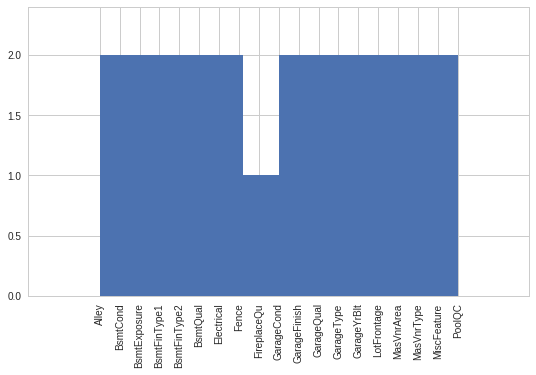

In [125]:

plt.hist(nullValues.index, orientation='vertical')
plt.xticks(nullValues.index, nullValues.index, rotation='vertical')
plt.margins(0.2)
# Tweak spacing to prevent clipping of tick-labels
plt.subplots_adjust(bottom=0.15)
plt.show()